### The github repository for the same could be found [here](https://github.com/datasciencemachine/research.git)

## TO INSTALL DIRECTORIES REQUIRED

In [25]:
!pip install object-detection
!pip install pycocotools


## CLONING FILES FROM MY GITHUB DIRECTORY

In [26]:
!git clone https://github.com/datasciencemachine/research.git

Cloning into 'research'...
remote: Enumerating objects: 26, done.
remote: Counting objects: 100% (26/26), done.
remote: Compressing objects: 100% (16/16), done.
remote: Total 2129 (delta 4), reused 25 (delta 4), pack-reused 2103
Receiving objects: 100% (2129/2129), 178.48 MiB | 33.05 MiB/s, done.
Resolving deltas: 100% (394/394), done.


In [27]:
cd research/

/content/research/object_detection/research


## ADDING REQUIRED LIBRARIES

In [0]:
import numpy as np
import os
import six.moves.urllib as urllib
import sys
import tarfile
import tensorflow as tf
import zipfile

from collections import defaultdict
from io import StringIO
from matplotlib import pyplot as plt
from PIL import Image
from IPython.display import display
import os
import pathlib

In [0]:
%%bash
protoc object_detection/protos/*.proto --python_out=.

In [0]:
from object_detection.utils import ops as utils_ops
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util

In [0]:
# patch tf1 into `utils.ops`
utils_ops.tf = tf.compat.v1

# Patch the location of gfile
tf.gfile = tf.io.gfile

## TO LOAD THE MODEL

In [0]:
def load_model(model_name):
  base_url = 'http://download.tensorflow.org/models/object_detection/'
  model_file = model_name + '.tar.gz'
  model_dir = model_name

  model_dir = pathlib.Path(model_dir)/"saved_model"

  model = tf.saved_model.load(str(model_dir))
  model = model.signatures['serving_default']

  return model

In [33]:
cd object_detection/

/content/research/object_detection/research/object_detection


## LOADING THE IMAGE TAGS

In [0]:
# List of the strings that is used to add correct label for each box.
PATH_TO_LABELS = 'data/mscoco_label_map.pbtxt'
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)

## LOADING TEST IMAGES

In [35]:
# If you want to test the code with your images, just add path to the images to the TEST_IMAGE_PATHS.
PATH_TO_TEST_IMAGES_DIR = pathlib.Path('images')
TEST_IMAGE_PATHS = sorted(list(PATH_TO_TEST_IMAGES_DIR.glob("*.jpg")))
TEST_IMAGE_PATHS

[PosixPath('images/animal.jpg'), PosixPath('images/saunders-car.jpg')]

## LOADING THE MODEL

In [36]:

model_name = 'ssd_mobilenet_v2_coco_2018_03_29'
detection_model = load_model(model_name)

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


In [37]:
print(detection_model.inputs)

[<tf.Tensor 'image_tensor:0' shape=(None, None, None, 3) dtype=uint8>]


In [38]:
detection_model.output_dtypes

{'detection_boxes': tf.float32,
 'detection_classes': tf.float32,
 'detection_scores': tf.float32,
 'num_detections': tf.float32}

In [39]:
detection_model.output_shapes

{'detection_boxes': TensorShape([None, 100, 4]),
 'detection_classes': TensorShape([None, 100]),
 'detection_scores': TensorShape([None, 100]),
 'num_detections': TensorShape([None])}

## RUNNING DETECTION ON TEST IMAGES

In [0]:
def run_inference_for_single_image(model, image):
  image = np.asarray(image)
  # The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
  input_tensor = tf.convert_to_tensor(image)
  # The model expects a batch of images, so add an axis with `tf.newaxis`.
  input_tensor = input_tensor[tf.newaxis,...]

  # Run inference
  output_dict = model(input_tensor)

  # All outputs are batches tensors.
  # Convert to numpy arrays, and take index [0] to remove the batch dimension.
  # We're only interested in the first num_detections.
  num_detections = int(output_dict.pop('num_detections'))
  output_dict = {key:value[0, :num_detections].numpy() 
                 for key,value in output_dict.items()}
  output_dict['num_detections'] = num_detections

  # detection_classes should be ints.
  output_dict['detection_classes'] = output_dict['detection_classes'].astype(np.int64)
   
  # Handle models with masks:
  if 'detection_masks' in output_dict:
    # Reframe the the bbox mask to the image size.
    detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
              output_dict['detection_masks'], output_dict['detection_boxes'],
               image.shape[0], image.shape[1])      
    detection_masks_reframed = tf.cast(detection_masks_reframed > 0.5,
                                       tf.uint8)
    output_dict['detection_masks_reframed'] = detection_masks_reframed.numpy()
    
  return output_dict

In [0]:
def show_inference(model, image_path):
  # the array based representation of the image will be used later in order to prepare the
  # result image with boxes and labels on it.
  image_np = np.array(Image.open(image_path))
  # Actual detection.
  output_dict = run_inference_for_single_image(model, image_np)
  # Visualization of the results of a detection.
  vis_util.visualize_boxes_and_labels_on_image_array(
      image_np,
      output_dict['detection_boxes'],
      output_dict['detection_classes'],
      output_dict['detection_scores'],
      category_index,
      instance_masks=output_dict.get('detection_masks_reframed', None),
      use_normalized_coordinates=True,
      line_thickness=8)

  display(Image.fromarray(image_np))

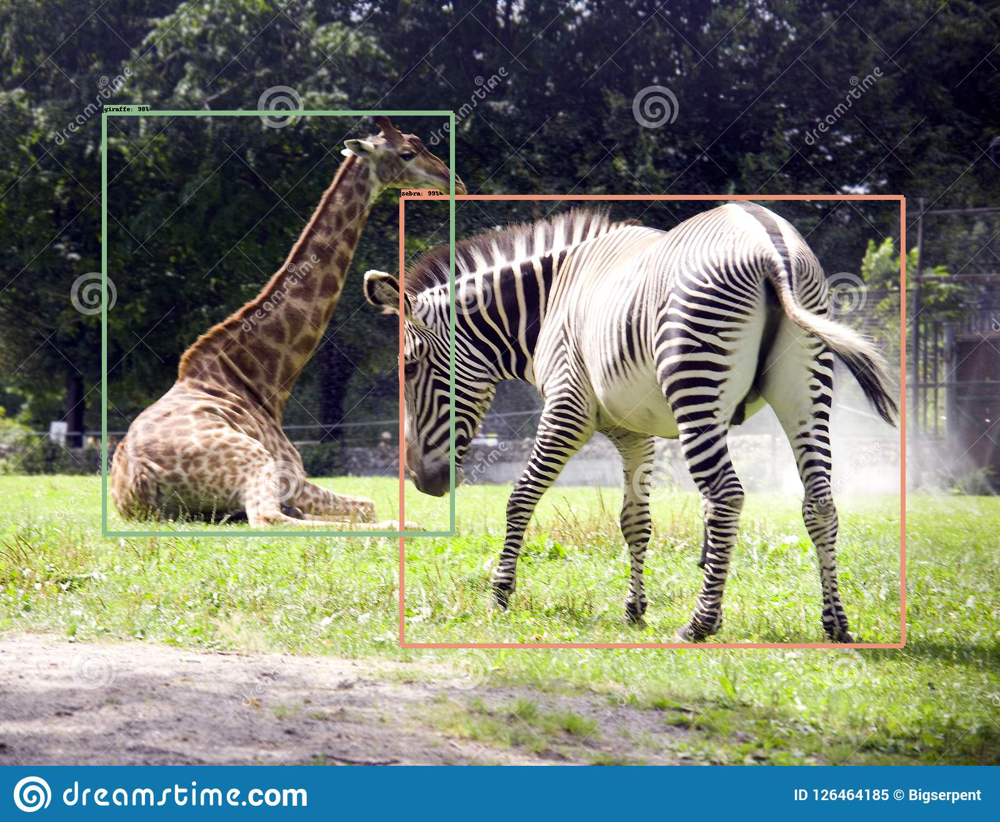

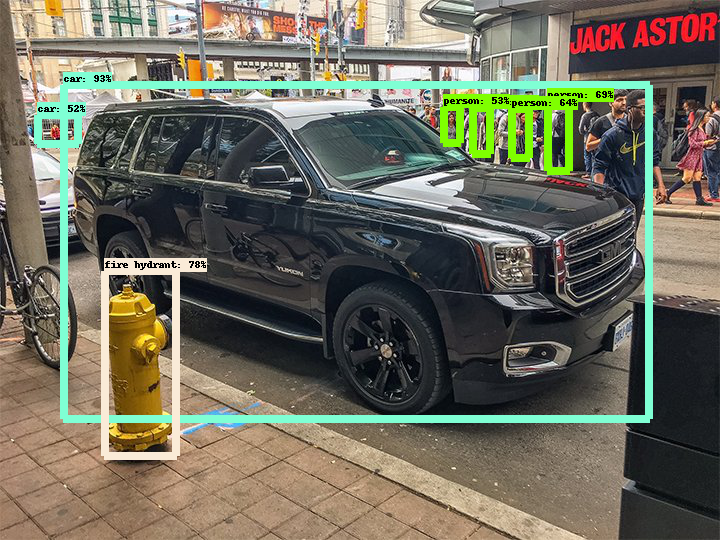

In [42]:
for image_path in TEST_IMAGE_PATHS:
  show_inference(detection_model, image_path)

### ENTER MODEL NAME AND IMAGE PATH IN THE CELL BELOW AND UNCOMMENT THE CELLS BELOW

In [0]:
model_name = "enter model name"
new_image_path='enter image path'


You can check the specifications of various models here [detection model zoo](https://https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/detection_model_zoo.md)

In [0]:
def load_new_model(model_name):
  base_url = 'http://download.tensorflow.org/models/object_detection/'
  model_file = model_name + '.tar.gz'
  model_dir = tf.keras.utils.get_file(
    fname=model_name, 
    origin=base_url + model_file,
    untar=True)

  model_dir = pathlib.Path(model_dir)/"saved_model"

  model = tf.saved_model.load(str(model_dir))
  model = model.signatures['serving_default']

  return model

In [49]:
#new_model = load_new_model(model_name)

187932672/187925923 [==============================] - 1s 0us/step
INFO:tensorflow:Saver not created because there are no variables in the graph to restore


## FOR A SINGLE IMAGE

In [0]:
#show_inference(new_model, new_image_path)

## FOR A DIRECTORY OF IMAGES





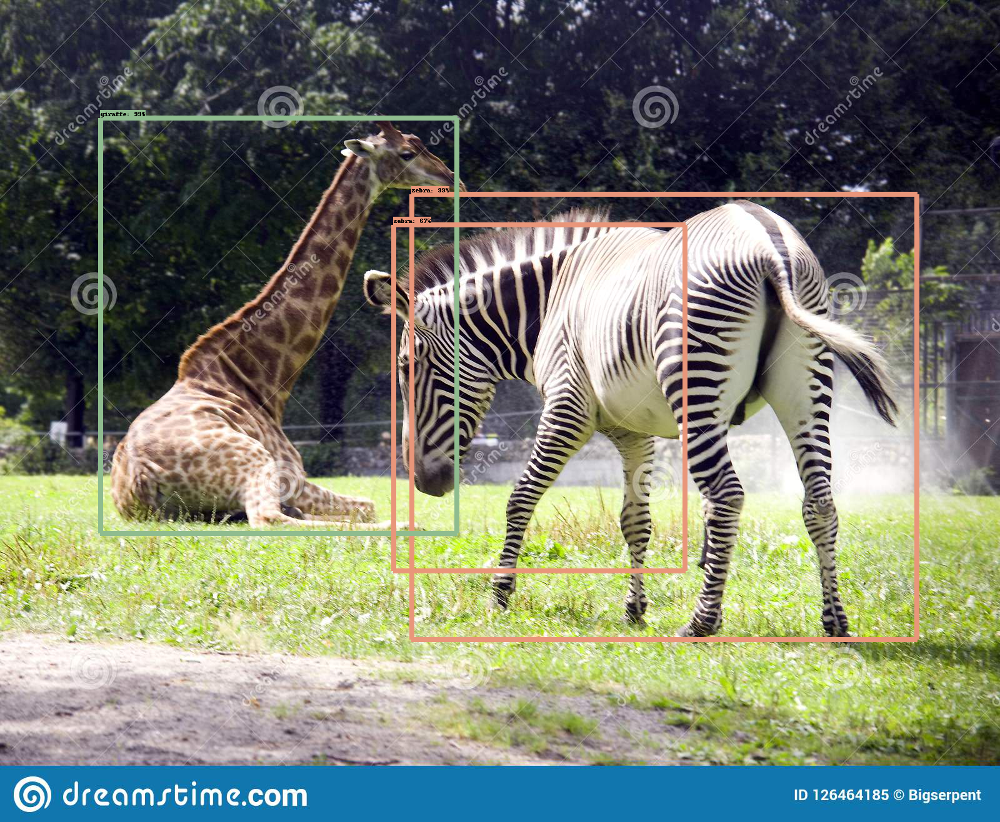

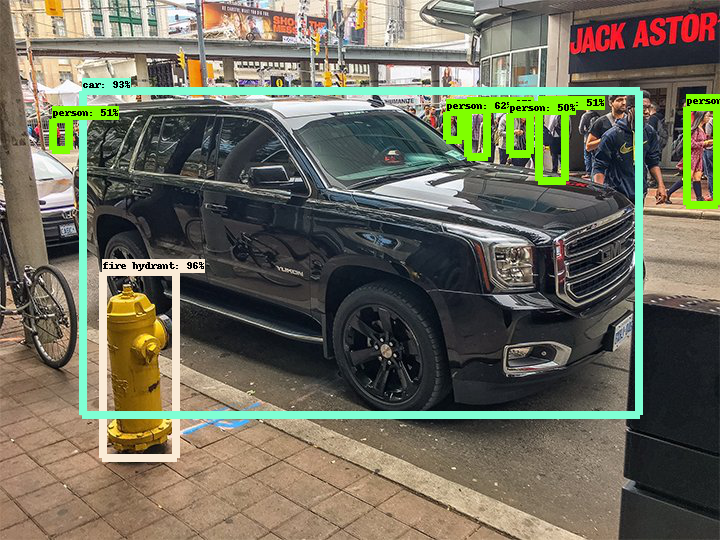

In [51]:
#PATH_TO_TEST_IMAGES_DIR = pathlib.Path('new_image_path')
#TEST_IMAGE_PATHS = sorted(list(PATH_TO_TEST_IMAGES_DIR.glob("*.jpg")))
#TEST_IMAGE_PATHS
#for image_path in TEST_IMAGE_PATHS:
#  show_inference(new_model, image_path)